In [1]:
import os
while not (os.getcwd().split('\\')[-1] == 'ecological-networks' or os.getcwd().split('/')[-1] == 'ecological-networks'):
    %cd ..
import setup_paths
setup_paths.add_path()
from Species_Reintroductions import *
global DATA_TYPE
DATA_TYPE = 'Real_1D'
CASE_TO_SOLVE_init(DATA_TYPE)
get_CASE()

def CASE_init(CASE_TO_SOLVE):
    DATA_TYPE = CASE_TO_SOLVE
    CASE_TO_SOLVE_init(DATA_TYPE)
    NetworkName_Solved_df = UnpickleObj(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '01_Simulation_Execution', f"Network_Solved_{DATA_TYPE.split('_')[0]}.pkl"))
    M = UnpickleObj(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '01_Simulation_Execution', f"M_{DATA_TYPE.split('_')[0]}.pkl"))
    if DATA_TYPE.split('_')[0] == 'Syn':
        M = {k:M[k] for k in M.keys() if int(k.split('_')[2]) == 100}
    return DATA_TYPE, NetworkName_Solved_df, M

from scipy.optimize import fsolve
from scipy import stats
import scipy.linalg as la
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn import preprocessing


d:\Github\ecological-networks\Code\01_Species_Reintroductions
d:\Github\ecological-networks\Code
d:\Github\ecological-networks
Real_1D


In [ ]:
DATA_TYPE, NetworkName_Solved_df, M = CASE_init('Real_2D')
loc = '04'
X = {}
for NetworkName in M.keys():
    FileName = os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '05_Analysis', 'Dyna_SR', f"{loc}", f"{NetworkName}.pkl")
    X[NetworkName] = UnpickleObj(FileName)


In [ ]:
print(type(X))
print(X.keys())
#for key in X.keys():
    #print(key, ' : ', X[key].shape)
#print(list(X[key].columns))
#del key
print([(i,v) for i,v in enumerate(list(X[list(X.keys())[0]].columns))])

In [ ]:
for key in X.keys():
    Y = X[key].copy()
    Y.drop_duplicates(inplace=True, ignore_index=True)
    print(key, ' : ', X[key].shape, ' : ', Y.shape, ' : ', X[key].shape[0]-Y.shape[0])

In [ ]:
DF = pd.DataFrame([], columns=list(Y.columns))
for key in X.keys():
    X[key] = X[key].apply(pd.to_numeric)
    X[key].drop_duplicates(inplace=True, ignore_index=True)
    X[key].drop(X[key][ X[key]['Ob Abundance'] == 0 ].index ,inplace = True)
    DF = pd.concat([DF,X[key]], ignore_index = True)
DF = DF.apply(pd.to_numeric)
DF.sort_values(by = ['Abundance', 'Ob Abundance'], axis = 0, inplace = True, ignore_index = True)
DF.drop(DF[ DF['Ob Abundance'] == 0 ].index ,inplace = True)
DF.reset_index(drop = True, inplace = True)

print(DF.shape)
DF.describe()

In [ ]:
D = DF.copy()
for Col_Name in list(DF.columns):
    
    X_scaled = preprocessing.MinMaxScaler().fit_transform(np.array(D[Col_Name]).reshape(-1,1))
    D[Col_Name] = X_scaled
del Col_Name, X_scaled
D.corr()


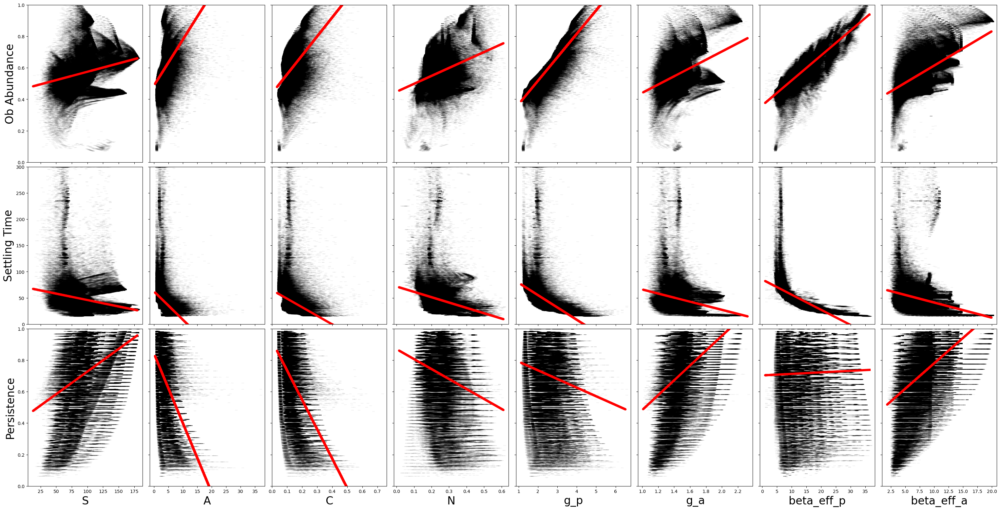

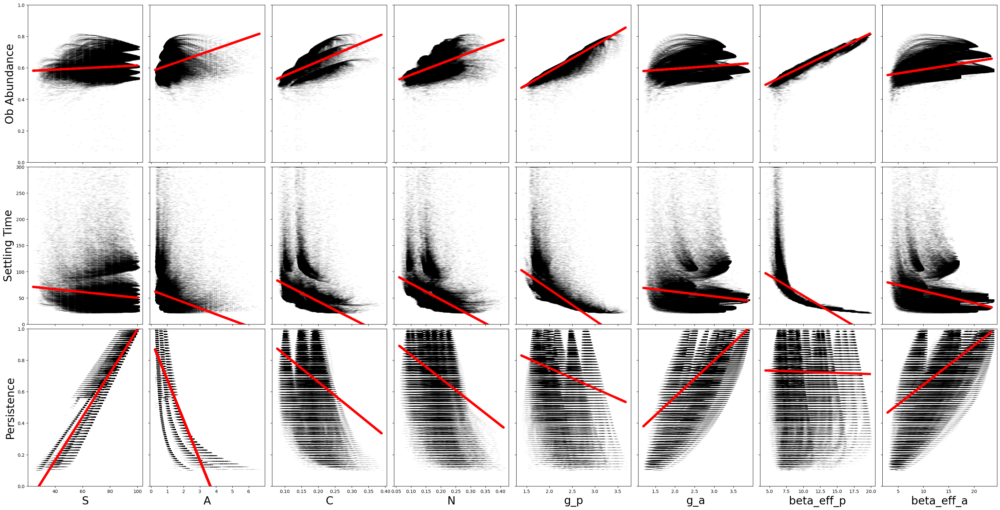

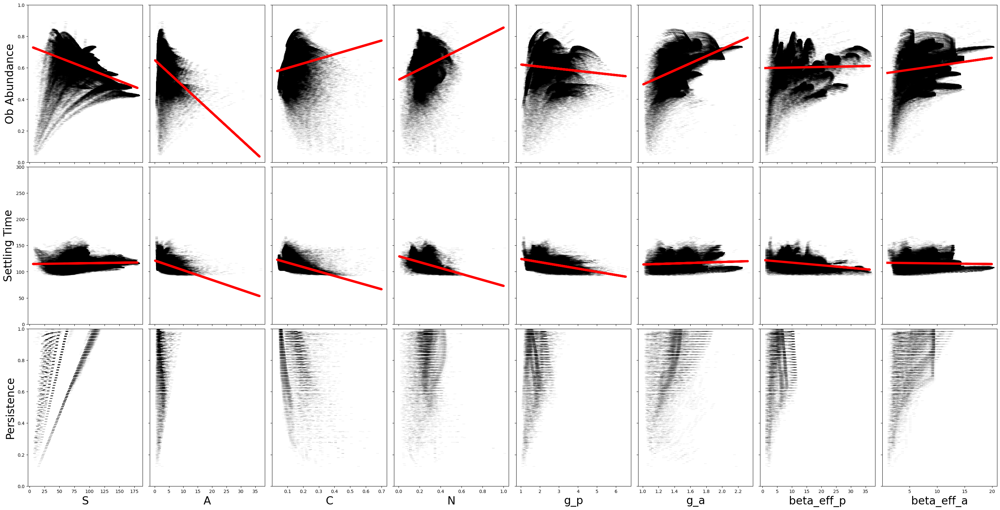

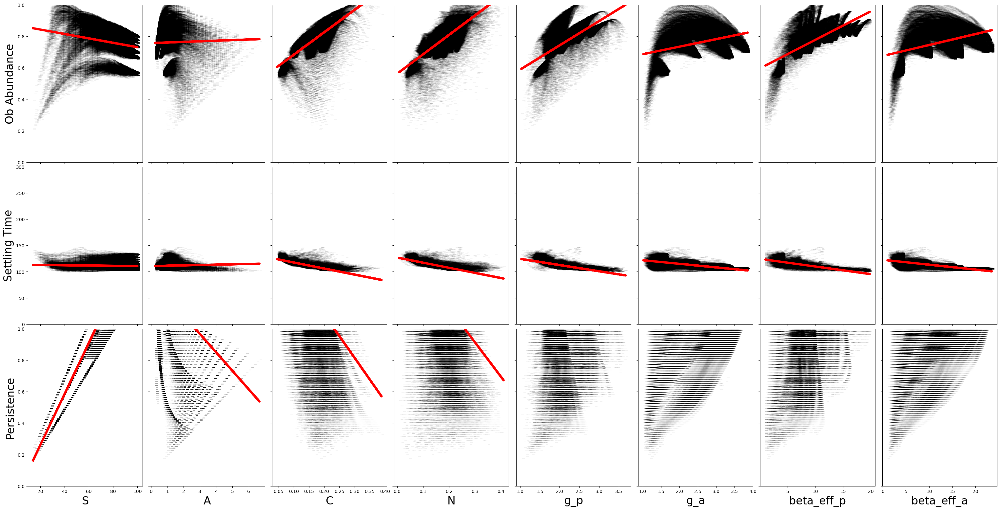

In [3]:
for CASE_TO_SOLVE, loc in zip(['Real_1D', 'Syn_1D', 'Real_2D', 'Syn_2D'],['01','02','04','03']):
    DATA_TYPE, NetworkName_Solved_df, M = CASE_init(CASE_TO_SOLVE)
    #loc = '01'
    X = {}
    for NetworkName in M.keys():
        FileName = os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '05_Analysis', 'Dyna_SR', f"{loc}", f"{NetworkName}.pkl")
        X[NetworkName] = UnpickleObj(FileName)

    DF = pd.DataFrame([], columns=['n','m','L','S','A','C','N','g_p','g_a','beta_eff_p','beta_eff_a','Abundance','Ob Abundance','Settling Time','Persistence'])
    for key in X.keys():
        X[key] = X[key].apply(pd.to_numeric)
        X[key].drop_duplicates(inplace=True, ignore_index=True)
        X[key].drop(X[key][ X[key]['Ob Abundance'] == 0 ].index ,inplace = True)
        DF = pd.concat([DF,X[key]], ignore_index = True)
    DF = DF.apply(pd.to_numeric)
    DF.sort_values(by = ['Abundance', 'Ob Abundance'], axis = 0, inplace = True, ignore_index = True)
    DF.drop(DF[ DF['Ob Abundance'] == 0 ].index ,inplace = True)
    DF.reset_index(drop = True, inplace = True)

    D = DF.copy()
    D.drop(D[ D['N'] == 0 ].index ,inplace = True)
    D.dropna(axis = 0, inplace = True)
    if DATA_TYPE.split('_')[1] == '1D':
        D = D[D['Abundance'] > 1.0]
    D.reset_index(drop = True, inplace = True)

    f, ax = plt.subplots(3,4+4, figsize = (30,15), dpi = 100, sharey = 'row', sharex = 'col')
    f.tight_layout(pad = 0)

    V_lst = ['S','A','C','N', 'g_p', 'g_a', 'beta_eff_p', 'beta_eff_a']
    Vy_lst = ['Ob Abundance', 'Settling Time', 'Persistence']

    for row, Vy in enumerate(Vy_lst):
        for col, V in enumerate(V_lst):

            X_seq = np.array(D[V]).reshape(-1,1)
            Y_seq = np.array(D[Vy]).reshape(-1,1)

            if DATA_TYPE.split('_')[1] == '1D':
                if Vy == 'Ob Abundance':
                    Y_seq = (Y_seq - 0) / (14-0)
            
            ax[row,col].scatter(X_seq,Y_seq, alpha = 0.05, color = 'black', marker = 1)

            regr = LinearRegression().fit(X_seq,Y_seq)
            ax[row,col].plot(X_seq,regr.predict(X_seq),color="red", linewidth = 5)

            ax[-1, col].set_xlabel(V, fontsize = 24)
            ax[row, 0].set_ylabel(Vy, fontsize = 24)

    ax[0,0].set_ylim([0.0, 1.0])
    ax[1,0].set_ylim([0, 300])
    ax[2,0].set_ylim([0.0, 1.0])

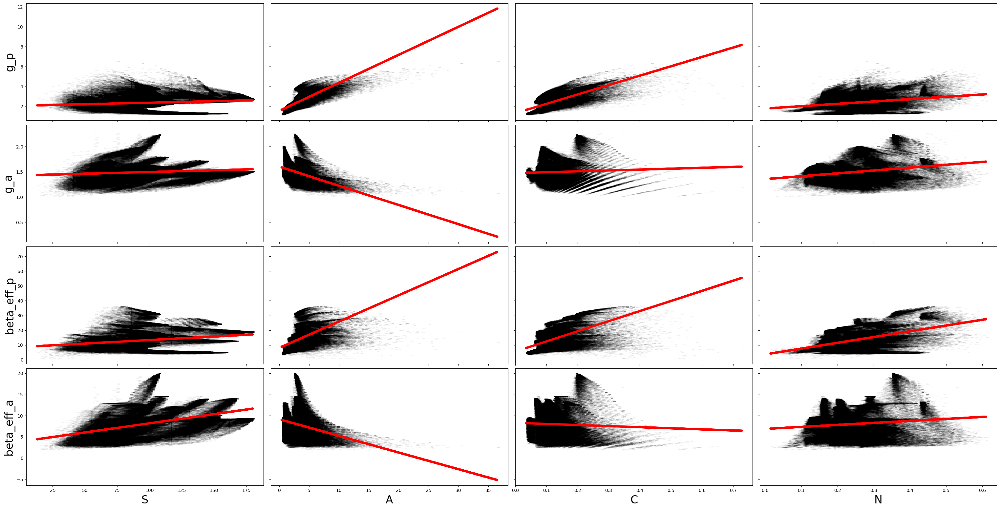

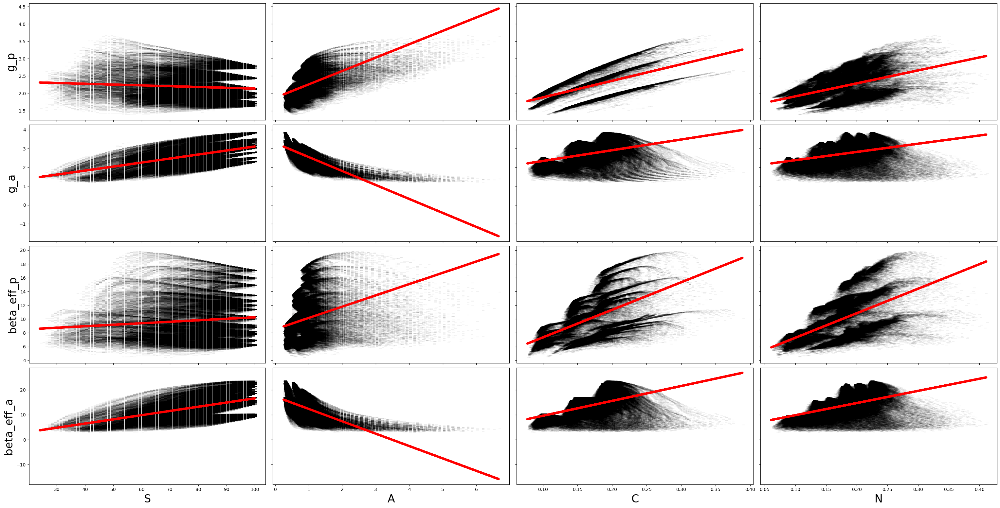

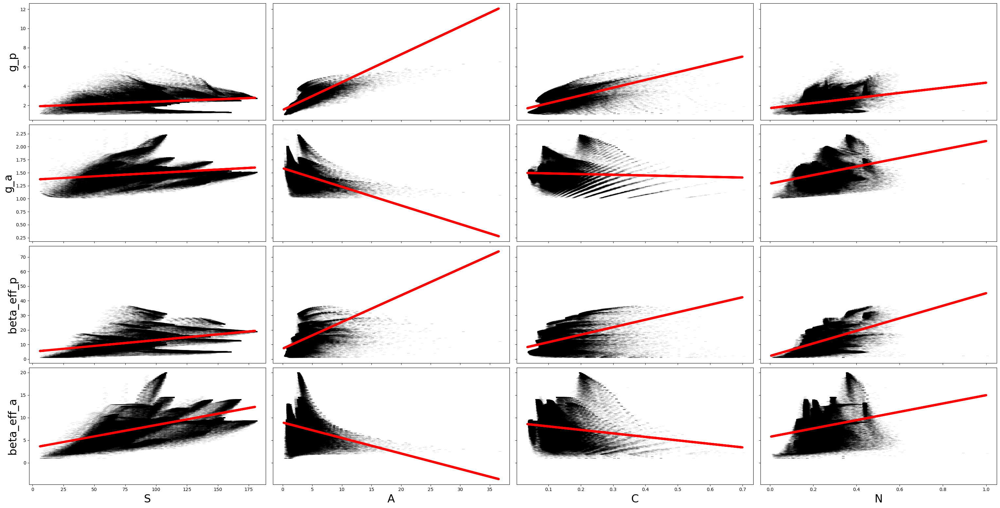

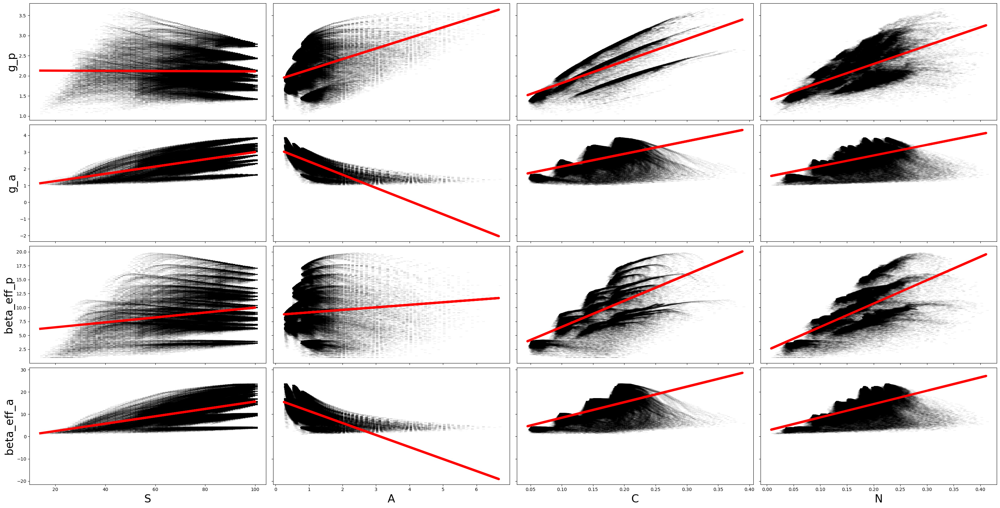

In [4]:
for CASE_TO_SOLVE, loc in zip(['Real_1D', 'Syn_1D', 'Real_2D', 'Syn_2D'],['01','02','04','03']):
    DATA_TYPE, NetworkName_Solved_df, M = CASE_init(CASE_TO_SOLVE)
    #loc = '01'
    X = {}
    for NetworkName in M.keys():
        FileName = os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '05_Analysis', 'Dyna_SR', f"{loc}", f"{NetworkName}.pkl")
        X[NetworkName] = UnpickleObj(FileName)

    DF = pd.DataFrame([], columns=['n','m','L','S','A','C','N','g_p','g_a','beta_eff_p','beta_eff_a','Abundance','Ob Abundance','Settling Time','Persistence'])
    for key in X.keys():
        X[key] = X[key].apply(pd.to_numeric)
        X[key].drop_duplicates(inplace=True, ignore_index=True)
        X[key].drop(X[key][ X[key]['Ob Abundance'] == 0 ].index ,inplace = True)
        DF = pd.concat([DF,X[key]], ignore_index = True)
    DF = DF.apply(pd.to_numeric)
    DF.sort_values(by = ['Abundance', 'Ob Abundance'], axis = 0, inplace = True, ignore_index = True)
    DF.drop(DF[ DF['Ob Abundance'] == 0 ].index ,inplace = True)
    DF.reset_index(drop = True, inplace = True)

    D = DF.copy()
    D.drop(D[ D['N'] == 0 ].index ,inplace = True)
    D.dropna(axis = 0, inplace = True)
    if DATA_TYPE.split('_')[1] == '1D':
        D = D[D['Abundance'] > 1.0]
    D.reset_index(drop = True, inplace = True)

    f, ax = plt.subplots(4,4, figsize = (30,15), dpi = 100, sharey = 'row', sharex = 'col')
    f.tight_layout(pad = 0)

    V_lst = ['S','A','C','N']
    Vy_lst = ['g_p', 'g_a', 'beta_eff_p', 'beta_eff_a']

    for row, Vy in enumerate(Vy_lst):
        for col, V in enumerate(V_lst):

            X_seq = np.array(D[V]).reshape(-1,1)
            Y_seq = np.array(D[Vy]).reshape(-1,1)

            if DATA_TYPE.split('_')[1] == '1D':
                if Vy == 'Ob Abundance':
                    Y_seq = (Y_seq - 0) / (14-0)
            
            ax[row,col].scatter(X_seq,Y_seq, alpha = 0.05, color = 'black', marker = 1)

            regr = LinearRegression().fit(X_seq,Y_seq)
            ax[row,col].plot(X_seq,regr.predict(X_seq),color="red", linewidth = 5)

            ax[-1, col].set_xlabel(V, fontsize = 24)
            ax[row, 0].set_ylabel(Vy, fontsize = 24)

    #ax[0,0].set_ylim([0.0, 1.0])
    #ax[1,0].set_ylim([0, 300])
    #ax[2,0].set_ylim([0.0, 1.0]) 